# Decoding mouse from trial syllables

In [6]:
prefix = '/home/ines/repositories/'
prefix = '/Users/ineslaranjeira/Documents/Repositories/'

In [7]:
""" 
IMPORTS
"""
import os
import numpy as np
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
# --Machine learning and statistics
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler,  LabelBinarizer
from sklearn.cluster import KMeans
import random
from sklearn import mixture
import pickle
from scipy.stats import mode
from sklearn.inspection import permutation_importance

# --Machine learning and statistics
from sklearn.model_selection import KFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import f1_score, confusion_matrix
from sklearn.preprocessing import OneHotEncoder
from scipy.stats import entropy

# Get my functions
from functions import create_grouped_gradient_palette, plot_cm, plot_f1

from one.api import ONE
one = ONE(mode='remote')

## Get sequences per trial epoch

In [8]:
seq_path = prefix + 'representation_learning_variability/paper-individuality/fig1_segmentation/'
# all_sequences = pd.read_parquet(seq_path+'all_sequences_09-22-2025')
all_sequences = pd.read_parquet(seq_path+'all_sequences_09-29-2025')

In [ ]:
mice = all_sequences.mouse_name.unique()

In [ ]:
# results_path = prefix + 'representation_learning_variability/Models/Sub-trial/4_analyses/1_HMM_states/'
results_path = prefix + 'representation_learning_variability/paper-individuality/fig1_segmentation/'
filename = str(results_path + 'epoch_sequences_10_03-11-2025')
# filename = str(results_path + 'all_sequences_09-22-2025')
# filename = str(results_path + 'all_sequences_5k_09-24-2025')
# filename = str(results_path + 'all_sequences_5_09-22-2025')
# filename = str(results_path + 'all_sequences_wheel_09-29-2025')
# all_sequences = pd.read_parquet(filename)
old_sequences = pickle.load(open(filename, 'rb'))

FileNotFoundError: [Errno 2] No such file or directory: '/Users/ineslaranjeira/Documents/Repositories/representation_learning_variability/paper-individuality/fig1_segmentation/epoch_sequences_10_03-11-2025'

In [7]:
old_mice = old_sequences.mouse_name.unique()

In [9]:
intersect_mice = np.intersect1d(mice, old_mice)

In [11]:
len(intersect_mice)

50

In [9]:
design_df = all_sequences.pivot(index=['sample', 'trial_type', 'mouse_name'], columns=['broader_label'], values='binned_sequence').reset_index().dropna()
var_names = design_df.keys()[-4:]

In [10]:
del all_sequences

In [11]:
df = design_df.copy()
df['feedback'] = df['trial_type'].str.split().str[:1].str.join('')
df['choice'] = df['trial_type'].str.split().str[3:4].str.join('')
df['block'] = df['trial_type'].str.split().str[2:3].str.join('')
df['contrast'] = df['trial_type'].str.split().str[1:2].str.join('')
df['side'] = df['choice'].copy()
df.loc[(df['feedback']=='correct') & (df['choice']=='right'), 'side'] = 'left'
df.loc[(df['feedback']=='correct') & (df['choice']=='left'), 'side'] = 'right'

df['session'] = df['sample'].str.split().str[:1].str.join('')
df['trial_id'] = df['sample'].str.split().str[1:2].str.join('')

df['contrast'] = df['contrast'].astype(float)
df['block'] = df['block'].astype(float)

df['choice'] = df['trial_type'].str.split().str[3:4].str.join('')
df.loc[df['choice']=='left', 'choice'] = 0
df.loc[df['choice']=='right', 'choice'] = 1

df.loc[df['feedback']=='correct', 'feedback'] = 1
df.loc[df['feedback']=='incorrect', 'feedback'] = 0

## Separate states per variable (one-hot encoding)

In [12]:
epoch_to_analyse = ['Pre-quiescence', 'Quiescence', 'Choice', 'ITI']

sequences_choice = np.vstack(df[epoch_to_analyse].apply(lambda row: np.hstack(row), axis=1))  # Transpose to get the right shape
use_sequences = sequences_choice[~np.isnan(sequences_choice).any(axis=1)]

use_states = int(max(np.unique(use_sequences)))+1
timesteps = np.shape(use_sequences)[1]
binarized = np.zeros((np.shape(use_sequences)[0], timesteps*use_states))

for t in range(timesteps):
    label_binarizer = LabelBinarizer()
    label_binarizer.fit(range(use_states))
    encoded_arr = label_binarizer.transform(use_sequences[:, t])
    binarized[:, t*use_states:(t+1)*use_states] = encoded_arr

In [13]:
final_matrix = binarized.copy()

([<matplotlib.axis.XTick at 0x7fa0cb3686a0>,
 [Text(0, 0, '0'),
  Text(160, 0, '160'),
  Text(320, 0, '320'),
  Text(480, 0, '480'),
  Text(640, 0, '640'),
  Text(800, 0, '800'),
  Text(960, 0, '960'),
  Text(1120, 0, '1120')])

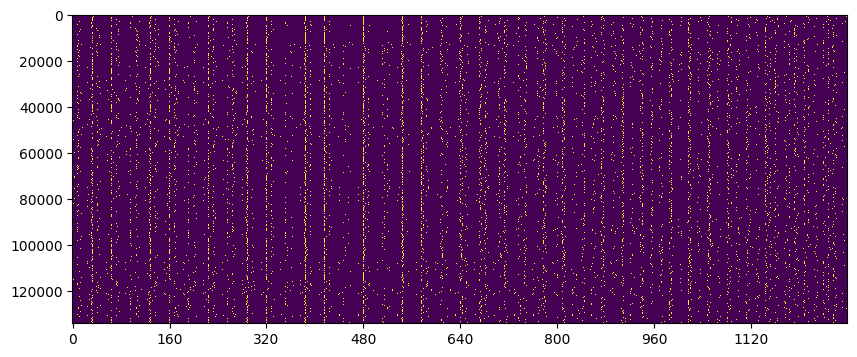

In [14]:
plt.figure(figsize=(10, 4))
plt.imshow(final_matrix, aspect='auto', cmap='viridis', interpolation='none')
plt.xticks(np.arange(0, np.shape(final_matrix)[1], 160), np.arange(0, np.shape(final_matrix)[1], 160))

# Get data of interest for decoder

In [15]:
# Pseudo-random selection of one mouse per lab
decoded_var = 'mouse_name'
var = 'fact_var'
unique_labels = len(df.mouse_name.unique())  # 70
random_mice = True
lab = 1

mat = pd.DataFrame(final_matrix)
mat['fact_var'] = pd.factorize(df[decoded_var])[0]
mat[decoded_var] = df[decoded_var]

if random_mice:
    use_labels = random.sample(list(mat['fact_var'].unique()), unique_labels)
elif lab is not None:
    # Take from specific lab
    mat['lab'] = pd.factorize(df['lab'])[0]
    use_labels = mat.loc[mat['lab']==lab, 'fact_var'].unique()[:unique_labels]
    mat = mat.drop(columns=['lab'])
else:
    # Take strictly different labs
    mat['lab'] = pd.factorize(df['lab'])[0]
    reduced_mat = mat[['lab']]
    reduced_mat = reduced_mat.drop_duplicates()
    mice_indices = reduced_mat.reset_index()['index']
    use_labels = list(mat.iloc[mice_indices]['fact_var'])[:unique_labels]  # Use only 11 labs to make sure I can control with mice from within lab
    mat = mat.drop(columns=['lab'])

named_labels = mat.loc[mat['fact_var'].isin(use_labels), decoded_var].drop_duplicates()
use_mat = mat.loc[mat['fact_var'].isin(use_labels)]
use_mat = use_mat.drop(columns=[decoded_var])
use_mat = use_mat.sort_values(by='fact_var')

## Decode mouse

In [16]:
shufflings = 1  #shuffling
# model = RandomForestClassifier(max_depth=2, random_state=0)
model = RandomForestClassifier(random_state=42)
# model = MultinomialNB()
repeats = 100

In [17]:
"""
RUN MODEL
"""

# Generate random states for each iteration with a fixed seed
# Loop over iterations of random draws of mice
# Create empty dataframes to save results
decoding_result = pd.DataFrame(columns=['shuffle', 'repeat', 'f1', 'confusion_matrix'])
dec_result = pd.DataFrame(columns=['shuffle', 'repeat', 'f1', 'confusion_matrix'])

for r in range(repeats):
    print('Repeat %d of %d' % (r+1, repeats))  
    # Decoding function with 10-fold cross validation
    kf = KFold(n_splits=5, shuffle=True, random_state=0)
    # use_mat = mat.copy() # test using all mice

    # Find minimum number of samples per label
    labels = np.array(use_mat[var])
    labels_nr = np.arange(len(use_mat[var]))
    min_freq = np.min(use_mat[var].value_counts())
    # min_freq = 400

    # Randomly select N mice from each quartile to equalize classes
    use_index = np.empty(0, dtype=int)
    for j, epoch in enumerate(np.unique(labels)):
        use_index = np.concatenate([use_index, np.random.choice(labels_nr[labels == epoch],
                                                                min_freq, replace=False)])

    new_mat = use_mat.iloc[use_index].reset_index().drop(columns=['index']).copy()
            
    # -- ORIGINAL DATASET
    y_pred = np.zeros(len(new_mat), dtype=int) 
    exog = new_mat[new_mat.columns.difference([var])]
    endog = new_mat.loc[:, var].copy()

    for train_index, test_index in kf.split(new_mat):
        model.fit(exog.iloc[train_index], endog.iloc[train_index].astype(int))
        y_pred[test_index] = model.predict(exog.iloc[test_index])

    # Calculate f1 score and confusion matrix
    f1 = f1_score(endog.astype(int), y_pred.astype('int'), average='micro')
    cm = confusion_matrix(endog.astype(int), y_pred.astype('int'), normalize='true')

    # Save results
    dec_result.loc[0, 'f1'] = f1
    dec_result.loc[0, 'confusion_matrix'] = cm
    dec_result.loc[0, 'shuffle'] = 0
    dec_result.loc[0, 'repeat'] = r

    decoding_result = pd.concat([decoding_result, dec_result])

    # -- SHUFFLED DATASET 
    shuffle_result = pd.DataFrame(columns=['shuffle', 'f1', 'confusion_matrix'])
    for s in range(shufflings):
        if np.mod(s+1, 10) == 0:
            print('Shuffling %d of %d' % (s+1, shufflings))   

        shuffle_y_pred = np.zeros(len(new_mat), dtype=int) 
        shuffle_endog = endog.copy()
        np.random.shuffle(shuffle_endog.values)

        for train_index, test_index in kf.split(new_mat):
            model.fit(exog.iloc[train_index], list(shuffle_endog.iloc[train_index].astype(int)))
            shuffle_y_pred[test_index] = model.predict(exog.iloc[test_index])   

        shuffle_f1 = f1_score(shuffle_endog.astype(int), shuffle_y_pred.astype('int'), average='micro')
        shuffle_cm = confusion_matrix(shuffle_endog.astype(int), shuffle_y_pred.astype('int'), normalize='true')

        # SAVE
        shuffle_result.loc[s, 'f1'] = shuffle_f1
        shuffle_result.loc[s, 'confusion_matrix'] = shuffle_cm
        shuffle_result.loc[s, 'shuffle'] = s + 1

    decoding_result = pd.concat([decoding_result, shuffle_result])

Repeat 1 of 100
Repeat 2 of 100
Repeat 3 of 100
Repeat 4 of 100
Repeat 5 of 100
Repeat 6 of 100
Repeat 7 of 100
Repeat 8 of 100
Repeat 9 of 100
Repeat 10 of 100
Repeat 11 of 100
Repeat 12 of 100
Repeat 13 of 100
Repeat 14 of 100
Repeat 15 of 100
Repeat 16 of 100
Repeat 17 of 100
Repeat 18 of 100
Repeat 19 of 100
Repeat 20 of 100
Repeat 21 of 100
Repeat 22 of 100
Repeat 23 of 100
Repeat 24 of 100
Repeat 25 of 100
Repeat 26 of 100
Repeat 27 of 100
Repeat 28 of 100
Repeat 29 of 100
Repeat 30 of 100
Repeat 31 of 100
Repeat 32 of 100
Repeat 33 of 100
Repeat 34 of 100
Repeat 35 of 100
Repeat 36 of 100
Repeat 37 of 100
Repeat 38 of 100
Repeat 39 of 100
Repeat 40 of 100
Repeat 41 of 100
Repeat 42 of 100
Repeat 43 of 100
Repeat 44 of 100
Repeat 45 of 100
Repeat 46 of 100
Repeat 47 of 100
Repeat 48 of 100
Repeat 49 of 100
Repeat 50 of 100
Repeat 51 of 100
Repeat 52 of 100
Repeat 53 of 100
Repeat 54 of 100
Repeat 55 of 100
Repeat 56 of 100
Repeat 57 of 100
Repeat 58 of 100
Repeat 59 of 100
Repeat

In [16]:
diagonal = pd.DataFrame(np.diag(decoding_result.loc[decoding_result['shuffle']==0, 'confusion_matrix'].mean()))
diagonal['mouse_number'] = list(named_labels.dropna())
diagonal = diagonal.rename(columns={0: 'accuracy'})

In [18]:
diagonal.to_parquet('mouse_decoding_accuracy')

In [18]:
def plot_cm(decoding_result, trial_epochs, size, control=False):
    """
    PLOT RESULTS
    """

    # -- Confusion Matrix
    # labels = trial_epochs

    # Results on original model
    plt.rc('font', size=8) 
    plt.figure(figsize=size)
    # hmap = sns.color_palette("mako", as_cmap=True)
    hmap=plt.cm.get_cmap('Greys')
    data = decoding_result.loc[decoding_result['shuffle'] == 0]
    sns.heatmap(data['confusion_matrix'].mean(), annot=False, square=True,
        yticklabels=trial_epochs, xticklabels=trial_epochs, 
        cmap= hmap, vmin=0, vmax=1, fmt=".2f") 

    # plt.xticks([.5, 1.5, 2.5, 3.5], trial_epochs)
    # plt.yticks([.5, 1.5, 2.5, 3.5], trial_epochs)
    plt.xticks(rotation = 90)
    plt.yticks(rotation = 0)
    plt.xlabel('Predicted mouse')
    plt.ylabel('True mouse')
    # plt.savefig('full_cm.svg',dpi=500)
    plt.show()
    print('F1 results', data['f1'].mean())

    if control:
        # Results from shuffled model
        plt.rc('font', size=9) 
        plt.figure(figsize=size)
        data = decoding_result.loc[decoding_result['shuffle'] >0]
        sns.heatmap(data['confusion_matrix'].mean(), annot=False, square=True,
            yticklabels=trial_epochs, xticklabels=trial_epochs, 
            cmap= hmap, vmin=0, vmax=1, fmt=".2f")

        # plt.xticks([.5, 1.5, 2.5, 3.5], trial_epochs)
        # plt.yticks([.5, 1.5, 2.5, 3.5], trial_epochs)
        plt.xticks(rotation = 90)
        plt.yticks(rotation = 0)
        plt.xlabel('Predicted mouse')
        plt.ylabel('True mouse')
        plt.show()
        print('F1 shuffled results',  data['f1'].mean())
    plt.tight_layout()

In [19]:
np.shape(list(decoding_result['confusion_matrix'])[0])

(70, 70)

/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_78862/2413791802.py:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  hmap=plt.cm.get_cmap('Greys')


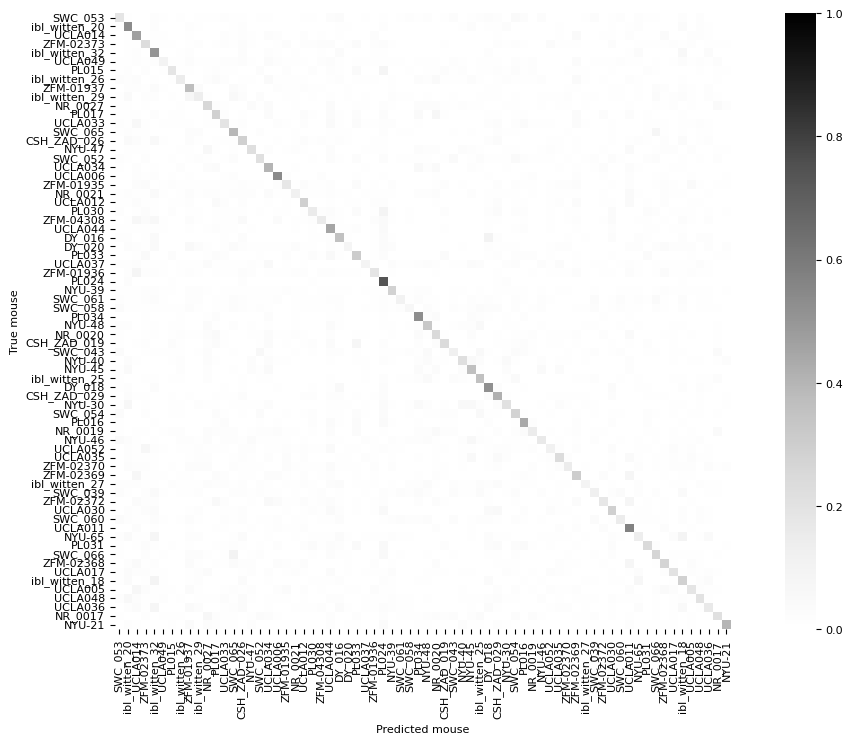

F1 results 0.2658848893888264


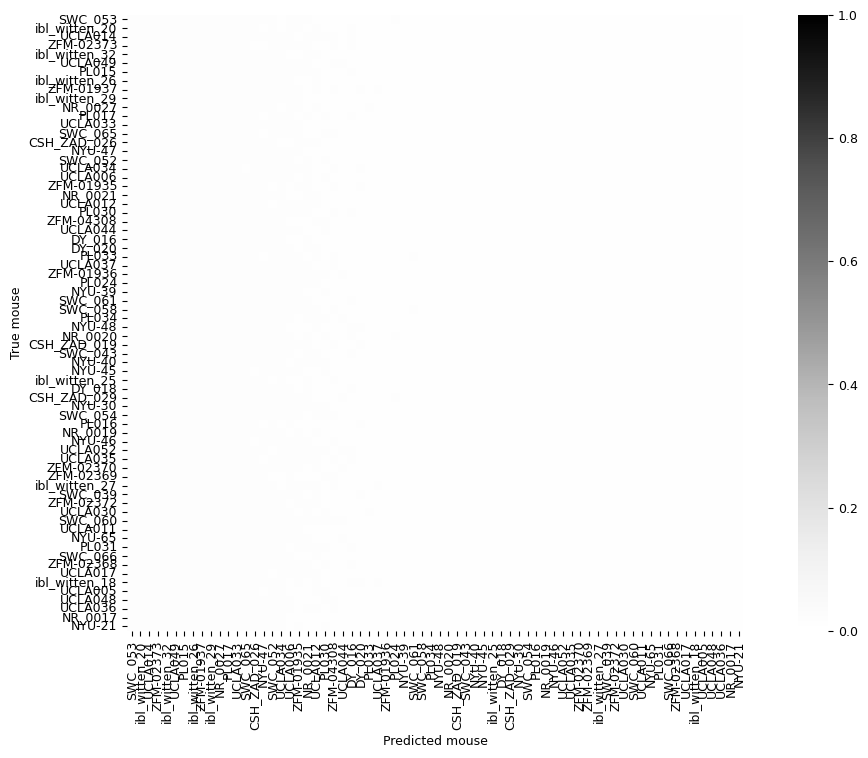

F1 shuffled results 0.014227596550431201


/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/seaborn/categorical.py:3544: UserWarning: 22.0% of the point

0    18.801567
0    17.994962
0    17.788413
0    19.013587
0    18.127604
       ...    
0    21.908257
0    17.261501
0    16.669834
0    18.320513
0    18.388601
Name: f1, Length: 100, dtype: object


/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/seaborn/categorical.py:3544: UserWarning: 69.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


<Figure size 640x480 with 0 Axes>

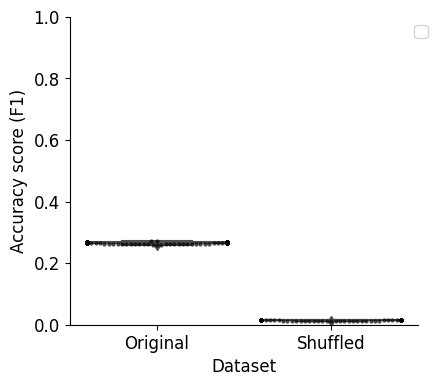

In [20]:
plot_cm(decoding_result, named_labels.dropna(), [14, 8], control=True)
plot_f1(decoding_result)
decoding_ratio = decoding_result.loc[decoding_result['shuffle']==0, 'f1']/decoding_result.loc[decoding_result['shuffle']==1, 'f1']
print(decoding_ratio)

## Compute importances

In [33]:
"""
RUN MODEL
"""

shufflings = 10
# Generate random states for each iteration with a fixed seed
# Loop over iterations of random draws of mice
# Create empty dataframes to save results
decoding_result = pd.DataFrame(columns=['shuffle', 'f1', 'confusion_matrix', 'importances'], index=range(shufflings))

for s in range(shufflings):
    print('Shuffling %d of %d' % (s, shufflings))
    # if np.mod(s+1, 10) == 0:
    #     print('Shuffling %d of %d' % (s+1, shufflings))   
        
    # Decoding function with 10-fold cross validation
    kf = KFold(n_splits=5, shuffle=True, random_state=0)
    use_mat = mat.copy() # test using all mice

    # Find minimum number of samples per label
    labels = np.array(use_mat[var])
    labels_nr = np.arange(len(use_mat[var]))
    min_freq = np.min(use_mat[var].value_counts())

    # Randomly select N mice from each quartile to equalize classes
    use_index = np.empty(0, dtype=int)
    for j, epoch in enumerate(np.unique(labels)):
        use_index = np.concatenate([use_index, np.random.choice(labels_nr[labels == epoch],
                                                                min_freq, replace=False)])

    new_mat = use_mat.iloc[use_index].reset_index().drop(columns=['index', 'mouse_name']).copy()
            
    # -- ORIGINAL DATASET
    dec_result = pd.DataFrame(columns=['shuffle', 'f1', 'confusion_matrix', 'importances'])
    y_pred = np.zeros(len(new_mat), dtype=int) 
    exog = new_mat[new_mat.columns.difference([var])]
    endog = new_mat.loc[:, var].copy()

    iter_importances = np.zeros((5, np.shape(exog)[1])) * np.nan
    fold = 0
    for train_index, test_index in kf.split(new_mat):
        model.fit(exog.iloc[train_index], endog.iloc[train_index].astype(int))
        y_pred[test_index] = model.predict(exog.iloc[test_index])

        # result = permutation_importance(model, exog.iloc[test_index], y_pred[test_index], 
        #                                 n_repeats=10, random_state=42, n_jobs=2)

        # sorted_importances_idx = result.importances_mean.argsort()
        # importances = pd.DataFrame(
        #     result.importances[sorted_importances_idx].T,
        #     columns=X.columns[sorted_importances_idx],
        # )

        mdi_importances = pd.Series(model[-1].feature_importances_) 
        iter_importances[fold, :] = np.array(mdi_importances)
        fold = fold +1
        
    # Calculate f1 score and confusion matrix
    f1 = f1_score(endog.astype(int), y_pred.astype('int'), average='micro')
    cm = confusion_matrix(endog.astype(int), y_pred.astype('int'), normalize='true')

    # Save results
    dec_result.loc[0, 'f1'] = f1
    dec_result.loc[0, 'confusion_matrix'] = cm
    dec_result.loc[0, 'shuffle'] = s
    dec_result.loc[0, 'importances'] = iter_importances

    decoding_result = pd.concat([decoding_result, dec_result])

Shuffling 0 of 10
Shuffling 1 of 10
Shuffling 2 of 10
Shuffling 3 of 10
Shuffling 4 of 10
Shuffling 5 of 10
Shuffling 6 of 10
Shuffling 7 of 10
Shuffling 8 of 10
Shuffling 9 of 10


In [37]:
use_states = int(max(np.unique(use_sequences)))+1
timesteps = np.shape(use_sequences)[1]
reshaped_importances = np.zeros((use_states, timesteps)) * np.nan
repeat_reshaped_importances = pd.DataFrame(columns=['syllable', 'timestep', 'importance', 'repeat'], index=range(use_states * timesteps))

for s in range(shufflings):
       reshaped_importances = pd.DataFrame(columns=['syllable', 'timestep', 'importance', 'repeat'], index=range(use_states * timesteps))

       for t in range(timesteps):
              mdi_importances = decoding_result.loc[decoding_result['shuffle']==s, 'importances']
              importances = np.mean(mdi_importances[0], axis=0)
              reshaped_importances['syllable'][t*use_states:(t+1)*use_states] = ['000', '100', '200', '300', '400', '500', '600', '700', '010', '110',
                     '210', '310', '410', '510', '610', '710', '001', '101', '201', '301', '401', '501', '601', '701', '011',
                     '111', '211', '311', '411', '511',  '611',  '711']
              reshaped_importances['timestep'][t*use_states:(t+1)*use_states] = t
              reshaped_importances['importance'][t*use_states:(t+1)*use_states] = importances[t*use_states:(t+1)*use_states]
              reshaped_importances['repeat'][t*use_states:(t+1)*use_states] = s

       repeat_reshaped_importances = pd.concat([repeat_reshaped_importances, reshaped_importances])

/tmp/ipykernel_24659/3830541113.py:12: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  reshaped_importances['syllable'][t*use_states:(t+1)*use_states] = ['000', '100', '200', '300', '400', '500', '600', '700', '010', '110',
/tmp/ipykernel_2465

/tmp/ipykernel_24659/3326747403.py:24: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axs[3].legend(loc='upper left', bbox_to_anchor=(1.1, 1))
/tmp/ipykernel_24659/3326747403.py:24: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axs[3].legend(loc='upper left', bbox_to_anchor=(1.1, 1))
/tmp/ipykernel_24659/3326747403.py:24: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axs[3].legend(loc='upper left', bbox_to_anchor=(1.1, 1))


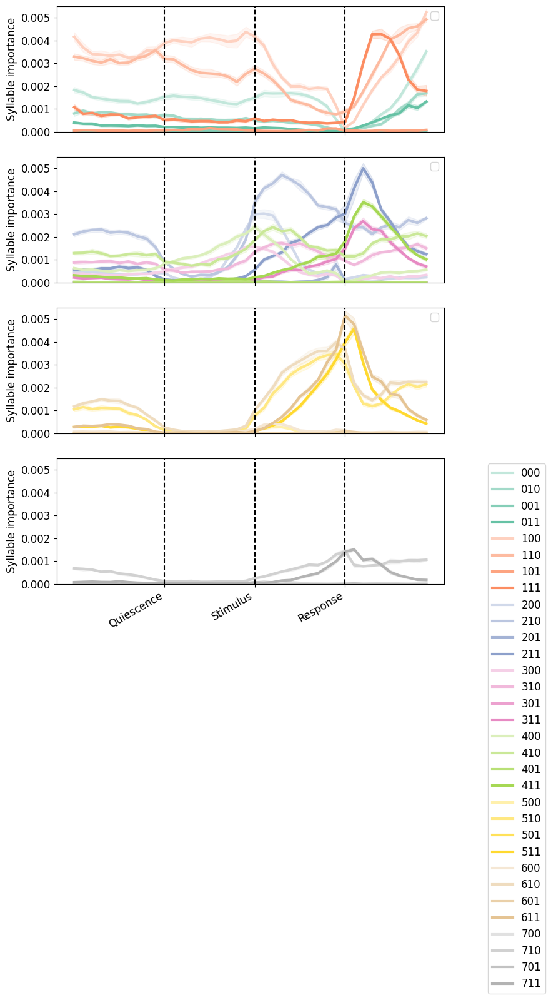

In [61]:
paw_syllable = [['000', '010', '001', '011', '100', '110', '101', '111'],
                [ '200', '210', '201', '211',
         '300', '310', '301', '311', '400', '410',  '401', '411'],
                ['500', '510', '501', '511', '600', '610', '601', '611'],
                ['700', '710', '701', '711']
                ]
order = ['000', '010', '001', '011', '100', '110', '101', '111', '200', '210', '201', '211',
         '300', '310', '301', '311', '400', '410',  '401', '411',
         '500', '510', '501', '511', '600', '610', '601', '611',
         '700', '710', '701', '711']

fig, axs = plt.subplots(4, 1, sharex=True, sharey=True, figsize=(8, 12))

for i in range(4):
    
    use_data = repeat_reshaped_importances.loc[repeat_reshaped_importances['syllable'].isin(paw_syllable[i])]
    sns.lineplot(x='timestep', y='importance', hue='syllable', data=use_data.reset_index(), 
                ax=axs[i], hue_order=order, palette=palette_16_list, linewidth=3)
    axs[i].axvline(x=10, color='k', linestyle='--')
    axs[i].axvline(x=20, color='k', linestyle='--')
    axs[i].axvline(x=30, color='k', linestyle='--')
    axs[i].legend('')

    axs[3].legend(loc='upper left', bbox_to_anchor=(1.1, 1))
    axs[i].set_ylabel('Syllable importance')
    axs[i].set_xlabel('')
    axs[i].set_ylim([0, 0.0055])
    axs[i].set_xticks(np.arange(10, 31, 10), ['Quiescence', 'Stimulus', 'Response'], rotation=30, ha='right')
plt.show()

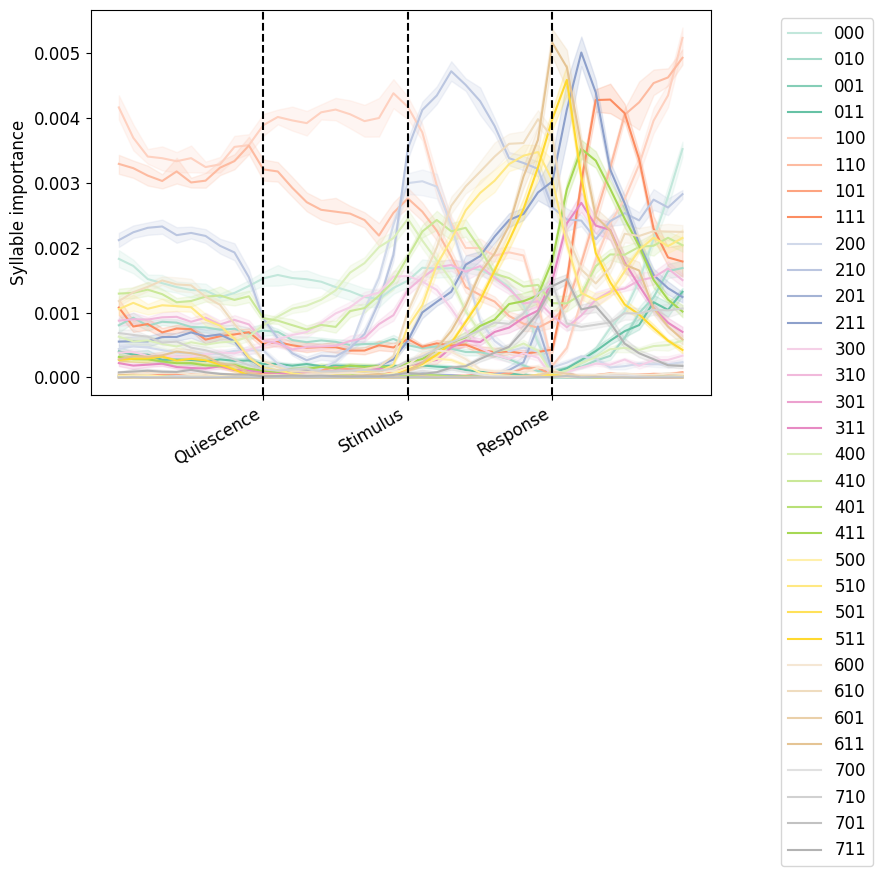

In [42]:
palette_16 = create_grouped_gradient_palette(n_groups=8, shades_per_group=4, base_palette='Set2')
palette_16_list = [palette_16(i) for i in range(palette_16.N)]  # Extract colors properly
order = ['000', '010', '001', '011', '100', '110', '101', '111', '200', '210', '201', '211',
         '300', '310', '301', '311', '400', '410',  '401', '411',
         '500', '510', '501', '511', '600', '610', '601', '611',
         '700', '710', '701', '711']
state_to_color = dict(zip(order, palette_16_list))

fig, axs = plt.subplots(1, 1, sharex=True, sharey=True, figsize=(8, 5))

sns.lineplot(x='timestep', y='importance', hue='syllable', data=repeat_reshaped_importances.reset_index(), 
             ax=axs, hue_order=order, palette=palette_16_list)
axs.axvline(x=10, color='k', linestyle='--')
axs.axvline(x=20, color='k', linestyle='--')
axs.axvline(x=30, color='k', linestyle='--')
axs.legend(loc='upper left', bbox_to_anchor=(1.1, 1))
axs.set_ylabel('Syllable importance')
axs.set_xlabel('')
axs.set_xticks(np.arange(10, 31, 10), ['Quiescence', 'Stimulus', 'Response'], rotation=30, ha='right')


/tmp/ipykernel_24659/1188687936.py:14: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(x='timestep', y='importance', data=importances_syllable,
/tmp/ipykernel_24659/1188687936.py:14: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(x='timestep', y='importance', data=importances_syllable,
/tmp/ipykernel_24659/1188687936.py:14: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(x='timestep', y='importance', data=importances_syllable,
/tmp/ipykernel_24659/1188687936.py:14: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(x='timestep', y='importance', data=importances_syllable,
/tmp/ipykernel_24659/1188687936.py:14: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(x='timestep', y='importance', data=importances_syllable,
/tmp/ipykernel_24659/1188687936.py:14: UserWarning: Ignoring

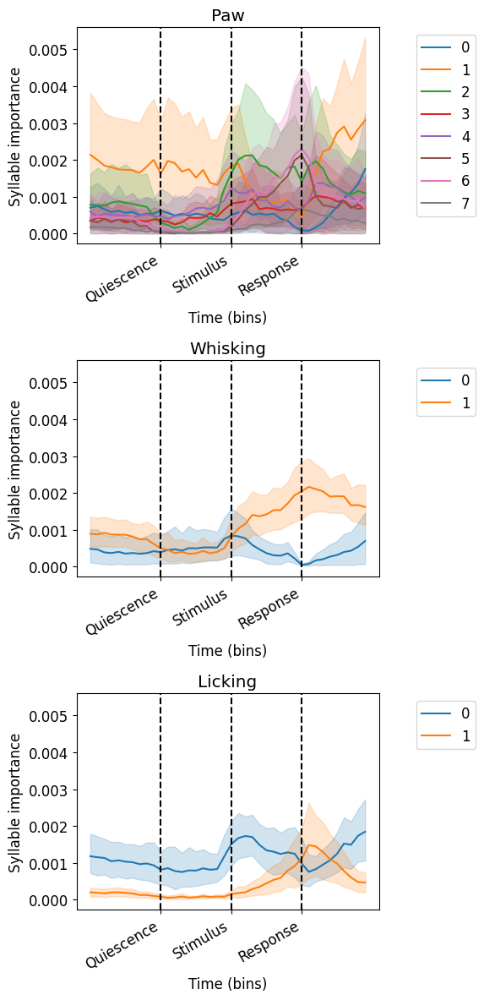

In [22]:
epoch_to_analyse = ['Pre-quiescence', 'Quiescence', 'Choice', 'ITI']

color = sns.color_palette("Set2", 8)
fig, axs = plt.subplots(3, 1, sharex=False, sharey=True, figsize=(6, 12))
syllables = np.array([[int(d) for d in s] for s in reshaped_importances['syllable']])
titles = ['Paw', 'Whisking', 'Licking']
for i in range(3):
    unique_syllable_digits = np.unique(syllables[:, i])
    for u in unique_syllable_digits:
        if len(unique_syllable_digits)==2 & u == 0:
            continue
        syllable_interest = np.where(syllables[:, i]==u)
        importances_syllable = reshaped_importances.loc[syllable_interest]
        sns.lineplot(x='timestep', y='importance', data=importances_syllable, 
             ax=axs[i], palette=color[u], label=str(u))
    axs[i].set_title(titles[i])
    axs[i].set_xlabel('Time (bins)')
    axs[i].set_ylabel('Syllable importance')
    axs[i].axvline(x=10, color='k', linestyle='--')
    axs[i].axvline(x=20, color='k', linestyle='--')
    axs[i].axvline(x=30, color='k', linestyle='--')
    axs[i].legend(loc='upper left', bbox_to_anchor=(1.1, 1))
    axs[i].set_xticks(np.arange(10, 31, 10), ['Quiescence', 'Stimulus', 'Response'], rotation=30, ha='right')
plt.tight_layout()


## Cluster based on error 

In [37]:
trials = pd.DataFrame(use_sequences)
trials['mouse_name'] = np.array(df['mouse_name'].reset_index()['mouse_name'])
trials['mouse_number'] = pd.factorize(df['mouse_name'])[0]

## Analyze entropy across trial per animal

In [ ]:
trials = pd.DataFrame(binarized)
trials['mouse_name'] = merged_df['mouse_name']
trials['mouse_number'] = pd.factorize(merged_df['mouse_name'])[0]
diagonal = pd.DataFrame(np.diag(decoding_result.loc[decoding_result['shuffle']==0, 'confusion_matrix'][0]))
diagonal['mouse_number'] = list(trials['mouse_number'].drop_duplicates())
diagonal = diagonal.rename(columns={0: 'accuracy'})
trials = trials.merge(diagonal, on=['mouse_number'])

Text(0.5, 0, 'Decoding accuracy')

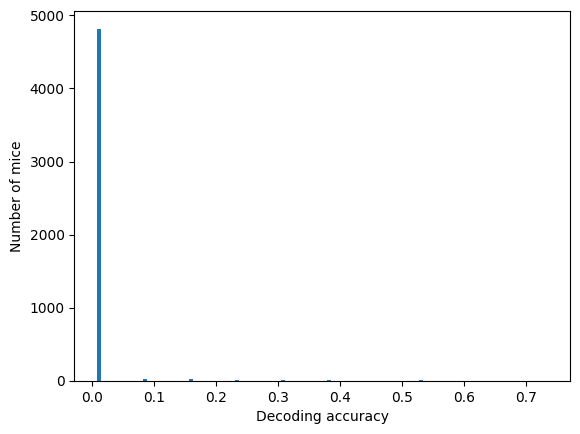

In [17]:
plt.hist(diagonal['accuracy'])
plt.ylabel('Number of mice')
plt.xlabel('Decoding accuracy')

In [ ]:
entropy_df = pd.DataFrame(columns=['mouse_name',  'accuracy', 'bin', 'entropy'])

for m, mouse in enumerate(trials['mouse_name'].unique()):
    
    use_df = trials.loc[trials['mouse_name']==mouse]
    state_probs = np.mean(use_df.drop(columns=['mouse_name', 'mouse_number', 'accuracy']), axis=0)
    
    mouse_entropy = pd.DataFrame(columns=['mouse_name', 'accuracy', 'bin', 'entropy'], index=range(timesteps))
    mouse_entropy['mouse_name'] = mouse
    mouse_entropy['accuracy'] = list(use_df['accuracy'])[0]
    
    for t in range(timesteps):
        # label_binarizer = LabelBinarizer()
        # label_binarizer.fit(range(use_states))
        # encoded_arr = label_binarizer.transform(use_sequences[:, t])
        bin_data = state_probs[t*16:(t+1)*16]
        ent = entropy(bin_data)/np.log(16)
        mouse_entropy['entropy'][t] = ent
        mouse_entropy['bin'][t] = t
        
    entropy_df = pd.concat([entropy_df, mouse_entropy])
        
    

/tmp/ipykernel_19502/2226901285.py:18: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  mouse_entropy['entropy'][t] = ent
/tmp/ipykernel_19502/2226901285.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a Da

In [ ]:
entropy_df['accuracy_type'] = entropy_df['accuracy']
entropy_df.loc[entropy_df['accuracy_type']<.05, 'accuracy_type'] = 0
entropy_df.loc[entropy_df['accuracy_type']>.3, 'accuracy_type'] = 2
entropy_df.loc[(entropy_df['accuracy_type']>.05) &
               (entropy_df['accuracy_type']<.3), 'accuracy_type'] = 1



Text(0.5, 0, 'Trial events')

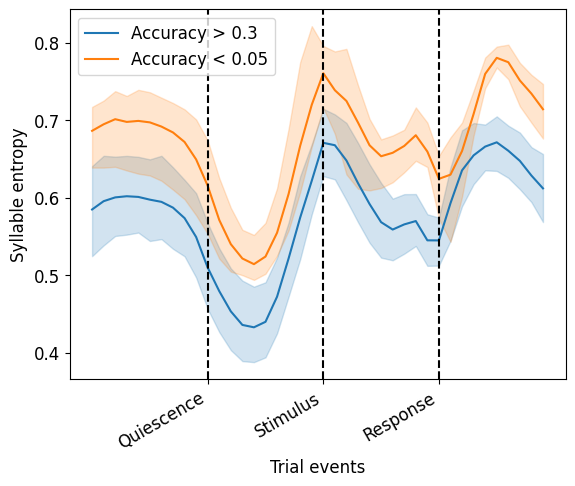

In [ ]:
sns.lineplot(x='bin', y='entropy', data=entropy_df.loc[entropy_df['accuracy']>.3], label='Accuracy > 0.3')
# sns.lineplot(x='bin', y='entropy', data=entropy_df.loc[(entropy_df['accuracy']>.05) &
#                                                        (entropy_df['accuracy']<.3)])
sns.lineplot(x='bin', y='entropy', data=entropy_df.loc[entropy_df['accuracy']<.05], label='Accuracy < 0.05')


plt.axvline(x=10, color='k', linestyle='--')
plt.axvline(x=20, color='k', linestyle='--')
plt.axvline(x=30, color='k', linestyle='--')

plt.xticks(np.arange(10, 31, 10), ['Quiescence', 'Stimulus', 'Response'], rotation=30, ha='right')
plt.ylabel('Syllable entropy')
plt.xlabel('Trial events')